# Setup
1. Ensure GPU is Available
2. Install Python libraries
3. Import libraries like YOLO
4. Create a File Path Map

In [2]:
import torch

# Check if CUDA (NVIDIA GPU) is available
if torch.cuda.is_available():
    print("GPU is available.")
    print("GPU name: ", torch.cuda.get_device_name(0))
else:
    print("No GPU found.")

GPU is available.
GPU name:  NVIDIA GeForce RTX 2080 Ti


In [3]:
!pip install -U ultralytics
!pip install supervision

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.2/881.2 kB 14.0 MB/s eta 0:00:00
Defaulting to user installation because normal site-packages is not writeable


In [4]:

import shutil
from pathlib import Path
import sys

from matplotlib import pyplot as plt
import skimage.io as io

import torch
from torch import cuda
import supervision as sv
from ultralytics import YOLO

import locale
locale.getpreferredencoding = lambda: "UTF-8"

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/home/lpuntous/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
print(sys.version)

has_gpu = cuda.is_available()
device = torch.device('cuda' if has_gpu else 'cpu')

print(device)
if has_gpu:
    print(cuda.get_device_name(0))
    

3.10.12 | packaged by conda-forge | (main, Jun 23 2023, 22:40:32) [GCC 12.3.0]
cuda
NVIDIA GeForce RTX 2080 Ti


Creating path variables for our new project 

In [6]:
path_map = {'ROOT': Path('craterdetectionluna')}
path_map['DS'] = path_map['ROOT'] / 'datasets'

# We will treat DS_CRATERS as the repository directory containing the
# original images and labels that are provided with the dataset. This helps
# keep things clean if we want to make another dataset using the same data
# (which we'll do in a few steps)
path_map['DS_CRATERS'] = path_map['DS'] / 'craters'
path_map['DS_CRATERS_IMAGES'] = path_map['DS_CRATERS'] / 'images'
path_map['DS_CRATERS_LABELS'] = path_map['DS_CRATERS'] / 'labels'

# Here is our project paths. We'll also keep this in DS for simplicity.
# We need three directories for our dataset: root, images, labels.
# In this case, "root" will be the project name. Additionally, we will define
# the path and name of another file we'll make later on.
path_map['PROJECT_NAME'] = "yolov9c_craters"
path_map['DS_PROJECT'] = path_map['DS'] / path_map['PROJECT_NAME']
path_map['PROJECT_IMAGES'] = path_map['DS_PROJECT'] / 'images'
path_map['PROJECT_LABELS'] = path_map['DS_PROJECT'] / 'labels'
path_map['PROJECT_DATA_YAML'] = path_map['DS_PROJECT'] / 'data.yaml'

# Declare the output paths that are created by the model automatically by
# the model. We'll declare them now because we will use them later.
path_map['RUNS'] = path_map['ROOT'] / 'runs'
path_map['DETECT'] = path_map['RUNS'] / 'detect'
path_map['PROJECT_RESULTS'] = path_map['DETECT'] / path_map['PROJECT_NAME']

def create_project_directories():
  print("Creating directory structure")
  for name, path in path_map.items():
      if isinstance(path, Path) and not path.suffix:
          path = path.resolve()
          path_map[name] = path
          path.mkdir(parents=True, exist_ok=True)
          print('  ',path)
  print("Complete")

create_project_directories()

# Prepare Data for YOLO
1. Create Training Data from CSV Bounding Box
2. Show Some Bounding Box + Image Examples
3. Intialize .yaml file for YOLO's input

In [7]:
from PIL import Image
import os

# Path to your images directory
images_dir = path_map['ROOT'] / "rocksdataset/images/render"

# Loop through each image in the directory to find the dimensions
for image_file in os.listdir(images_dir):
    if image_file.endswith((".tif", ".jpg", ".png")):  # Add any other extensions as needed
        image_path = os.path.join(images_dir, image_file)
        
        # Open the image
        with Image.open(image_path) as img:
            width, height = img.size
            print(f"Image: {image_file}, Width: {width}, Height: {height}")
        
        # Uncomment the following line if all images are the same size and you just need one sample
        break

FileNotFoundError: [Errno 2] No such file or directory: 'craterdetectionluna/rocksdataset/images/render'

## Create Training Data from CSV Bounding Boxes 


In [73]:
import pandas as pd
import os

# Load the CSV file
csv_path = path_map['ROOT'] / "rocksdataset/bounding_boxes.csv"
output_dir = path_map['ROOT'] / "labels"
image_width = 720  # Replace with the actual image width
image_height = 480  # Replace with the actual image height

# Delete old output directory if it exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
    
# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Read the CSV
df = pd.read_csv(csv_path)

# Process each row in the CSV
for _, row in df.iterrows():
    # Extract data from the CSV
    frame_number = int(row["Frame"])
    top_left_x = row["TopLeftCornerX"]
    top_left_y = row["TopLeftCornerY"]
    length = row["Length"]
    height = row["Height"]
    class_id = 0  # Assuming a single class (e.g., rock)

    # Convert to YOLO format
    center_x = (top_left_x + length / 2) / image_width
    center_y = (top_left_y + height / 2) / image_height
    width = length / image_width
    height = height / image_height

    # Construct the output filename
    output_filename = f"render{frame_number:04d}.txt"
    output_path = os.path.join(output_dir, output_filename)

    # Write the bounding box to the file
    with open(output_path, "a") as f:
        f.write(f"{class_id} {center_x:.6f} {center_y:.6f} {width:.6f} {height:.6f}\n")

print("Conversion complete. YOLO annotation files saved in 'labels' directory.")


Conversion complete. YOLO annotation files saved in 'labels' directory.


## Show 5 Examples of Training Images and their Bounding Boxes 


Bounding boxes for render0001.png:
Class: 0, Top-left: (278.50, 192.50), Width: 56.00, Height: 38.00


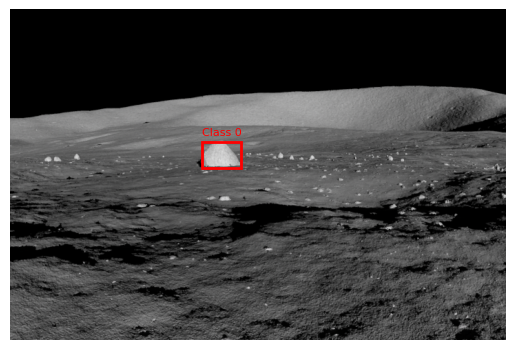

Bounding boxes for render0002.png:
Class: 0, Top-left: (599.50, 151.50), Width: 121.00, Height: 130.00


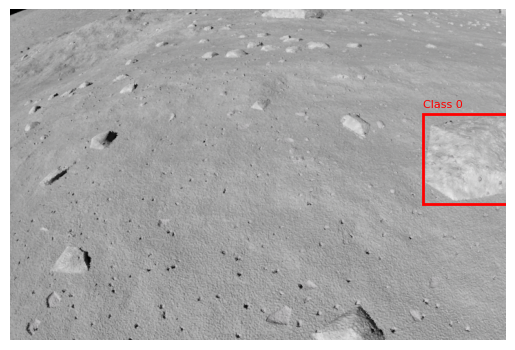

Bounding boxes for render0003.png:
Class: 0, Top-left: (5.50, 46.50), Width: 90.00, Height: 87.00


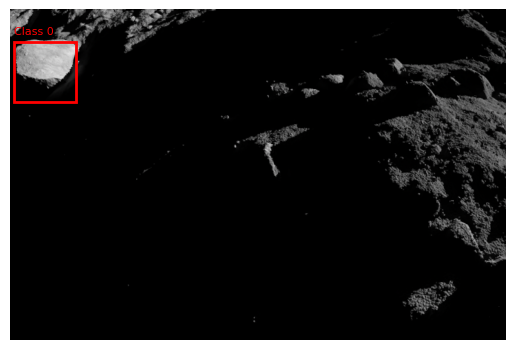

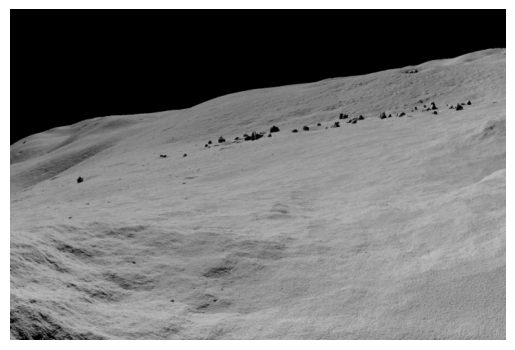

Bounding boxes for render0005.png:
Class: 0, Top-left: (239.50, 101.50), Width: 103.00, Height: 21.00


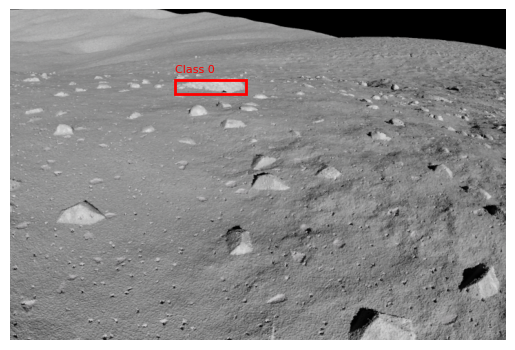

In [71]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

NUM_EXAMPLES = 5

# Paths to directories
images_dir = path_map['ROOT'] / "rocksdataset/images/render"
labels_dir = path_map['ROOT'] / "labels"

# Define image dimensions (replace with actual values if known)
image_width = 720
image_height = 480

# Select the first 5 images in the directory (sorted for consistency)
sample_images = sorted([img for img in os.listdir(images_dir) if img.endswith((".tif", ".jpg", ".png"))])[:NUM_EXAMPLES]

# Loop through sample images and display them with bounding boxes
for image_file in sample_images:
    image_path = os.path.join(images_dir, image_file)
    
    # Load image
    img = Image.open(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    # Find corresponding label file
    label_file = os.path.join(labels_dir, f"{os.path.splitext(image_file)[0]}.txt")
    
    # Check if label file exists
    if os.path.exists(label_file):
        # Read bounding box data from label file
        with open(label_file, "r") as f:
            print(f"Bounding boxes for {image_file}:")
            for line in f:
                # YOLO format: class_id, center_x, center_y, width, height
                class_id, center_x, center_y, width, height = map(float, line.strip().split())
                
                # Convert YOLO format to bounding box coordinates
                top_left_x = (center_x - width / 2) * image_width
                top_left_y = (center_y - height / 2) * image_height
                bbox_width = width * image_width
                bbox_height = height * image_height
                
                # Print bounding box coordinates
                print(f"Class: {int(class_id)}, Top-left: ({top_left_x:.2f}, {top_left_y:.2f}), "
                      f"Width: {bbox_width:.2f}, Height: {bbox_height:.2f}")
                
                # Create a rectangle patch
                rect = patches.Rectangle((top_left_x, top_left_y), bbox_width, bbox_height,
                                         linewidth=2, edgecolor="red", facecolor="none")
                ax.add_patch(rect)
                
                # Optional: display class_id above the box
                ax.text(top_left_x, top_left_y - 10, f"Class {int(class_id)}", color="red", fontsize=8)
    
    # Display the image with bounding boxes
    plt.axis("off")
    plt.show()


In [40]:
import yaml

def make_data_yaml(data_yaml_path, abs_root_path, rel_train_images_path, rel_val_images_path, class_map):
    """
    Creates a YAML configuration file for YOLO with plain text formatting.

    Parameters:
    - data_yaml_path (str): Path where the YAML file will be saved.
    - abs_root_path (str): Absolute root path of the dataset.
    - rel_train_images_path (str): Relative path to the training images directory from the root.
    - rel_val_images_path (str): Relative path to the validation images directory from the root.
    - class_map (dict): Dictionary mapping class IDs to class names.
    """
    with open(data_yaml_path, 'w') as f:
        f.write(f"path: {abs_root_path}\n")
        f.write(f"train: {rel_train_images_path}\n")  # Use relative path for images
        f.write(f"val: {rel_val_images_path}\n")
        f.write("names:\n")
        for id, name in class_map.items():
            f.write(f"  {id}: {name}\n")
    
    print(f"Created '{data_yaml_path}' with paths as plain strings.")


# PreProcess Data
1. Split the Train/Test Set

## Split Train/Test Dataset

In [41]:
import os
import shutil
import random

def split_dataset(images_dir, labels_dir, output_dir, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1):
    # Check if ratios sum to 1.0
    assert train_ratio + val_ratio + test_ratio == 1.0, "Ratios must sum to 1.0"

    # Paths for train, val, and test
    for subset in ["train", "val", "test"]:
        os.makedirs(os.path.join(output_dir, "images", subset), exist_ok=True)
        os.makedirs(os.path.join(output_dir, "labels", subset), exist_ok=True)

    # Get list of all images and shuffle
    images = [img for img in os.listdir(images_dir) if img.endswith((".jpg", ".png", ".tif"))]
    random.shuffle(images)

    # Split images into train, val, and test
    train_count = int(len(images) * train_ratio)
    val_count = int(len(images) * val_ratio)

    splits = {
        "train": images[:train_count],
        "val": images[train_count:train_count + val_count],
        "test": images[train_count + val_count:]
    }

    # Move images and labels to respective folders
    for subset, files in splits.items():
        for image in files:
            image_path = os.path.join(images_dir, image)
            label_path = os.path.join(labels_dir, image.replace(".jpg", ".txt").replace(".png", ".txt").replace(".tif", ".txt"))

            if os.path.exists(label_path):
                shutil.copy(image_path, os.path.join(output_dir, "images", subset, image))
                shutil.copy(label_path, os.path.join(output_dir, "labels", subset, os.path.basename(label_path)))
            # else:
            #     print(f"Warning: Label not found for {image}")
    print("Dataset split complete.")

In [42]:
split_dataset(
    images_dir=path_map['ROOT'] / "rocksdataset/images/render",
    labels_dir=path_map['ROOT'] /"labels",
    output_dir= path_map['PROJECT_IMAGES'],
    train_ratio=0.8,
    val_ratio=0.1,
    test_ratio=0.1
)

Dataset split complete.


In [43]:
# Adjusted usage example with the new function parameters
make_data_yaml(
    data_yaml_path="dataset.yaml",
    abs_root_path=str(path_map['ROOT'] / "datasets/yolov9c_craters"),  # Absolute root path to dataset
    rel_train_images_path="images/images/train",               # Relative path from root
    rel_val_images_path="images/images/val",                   # Relative path from root
    class_map={0: "rock"}                                      # Class map with ID and class name
)


Created 'dataset.yaml' with paths as plain strings.


# 🤖 Train The Model

In [78]:
from ultralytics import YOLO

# Initialize the model with pretrained weights
model = YOLO("yolov9c.pt")

model.train(
    data="dataset.yaml",        # Path to dataset YAML
    epochs=300,                 # Number of training epochs
    patience=25,                # Early stopping patience
    imgsz=512,                  # Image size
    batch=16,                   # Batch size
    iou=0.5,                    # IoU threshold for validation
    freeze=18                   # Freeze the first 18 layers
)


New https://pypi.org/project/ultralytics/8.3.27 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.10.15 torch-2.5.0+cu124 CUDA:0 (NVIDIA GeForce RTX 2070, 7952MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=dataset.yaml, epochs=300, time=None, patience=25, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train18, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=18, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=

RuntimeError: Dataset 'dataset.yaml' error ❌ 
Dataset 'dataset.yaml' images not found ⚠️, missing path '/home/microuasml/tmp/datasets/craterdetectionluna/datasets/yolov9c_craters/images/images/val'
Note dataset download directory is '/home/microuasml/tmp/datasets'. You can update this in '/home/microuasml/.config/Ultralytics/settings.json'

# 🧪 Validation

## Show Result of Trained Model on Some Images 


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0014.png: 352x512 1 rock, 21.1ms
Speed: 0.8ms preprocess, 21.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


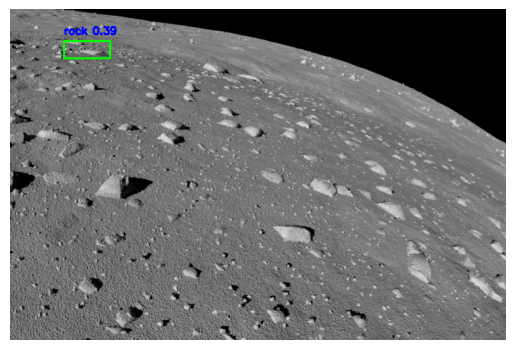


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0016.png: 352x512 2 rocks, 14.6ms
Speed: 0.8ms preprocess, 14.6ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 512)


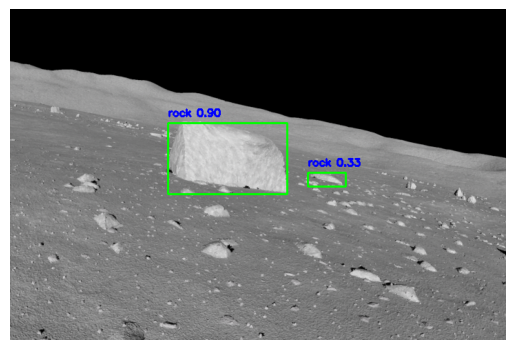


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0030.png: 352x512 3 rocks, 13.9ms
Speed: 0.8ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 512)


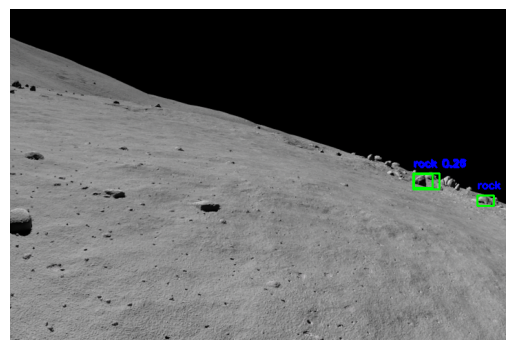


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0037.png: 352x512 (no detections), 13.9ms
Speed: 0.8ms preprocess, 13.9ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 512)


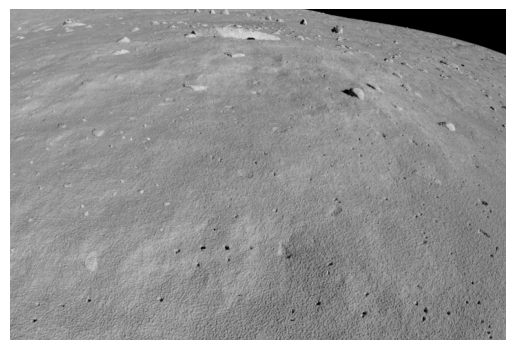


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0010.png: 352x512 (no detections), 13.2ms
Speed: 0.8ms preprocess, 13.2ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


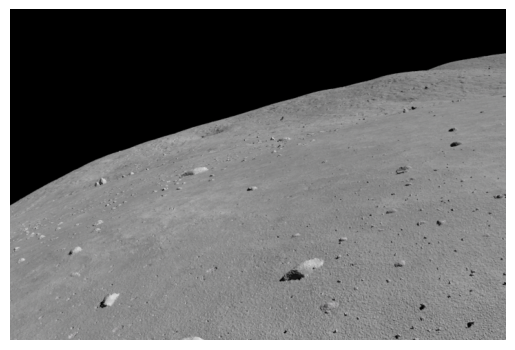


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0043.png: 352x512 (no detections), 13.8ms
Speed: 0.8ms preprocess, 13.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 512)


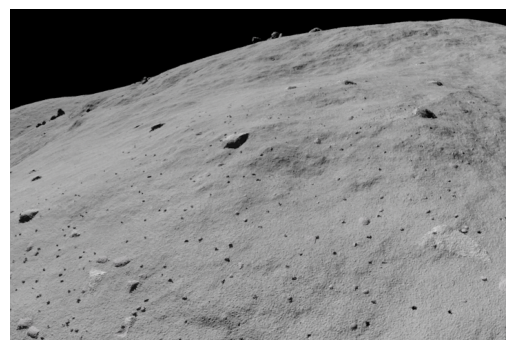


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0019.png: 352x512 (no detections), 13.1ms
Speed: 0.8ms preprocess, 13.1ms inference, 0.3ms postprocess per image at shape (1, 3, 352, 512)


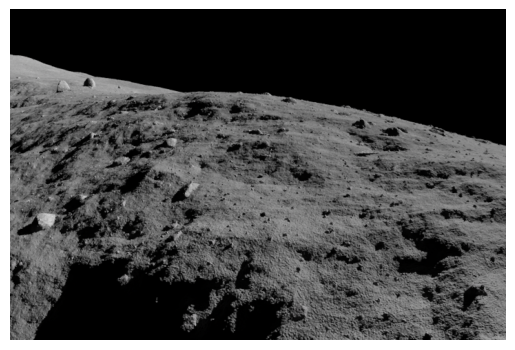


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0039.png: 352x512 4 rocks, 14.9ms
Speed: 0.8ms preprocess, 14.9ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


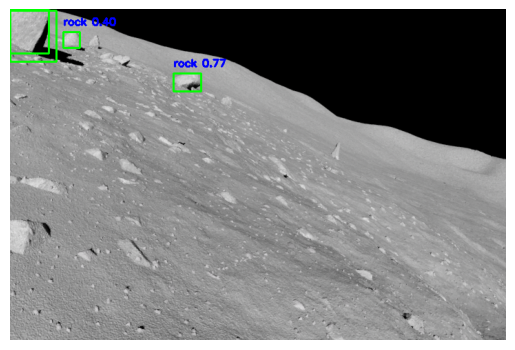


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0041.png: 352x512 6 rocks, 14.3ms
Speed: 0.8ms preprocess, 14.3ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 512)


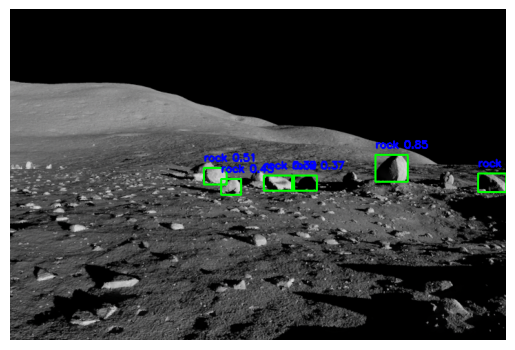


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0012.png: 352x512 1 rock, 14.7ms
Speed: 0.8ms preprocess, 14.7ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


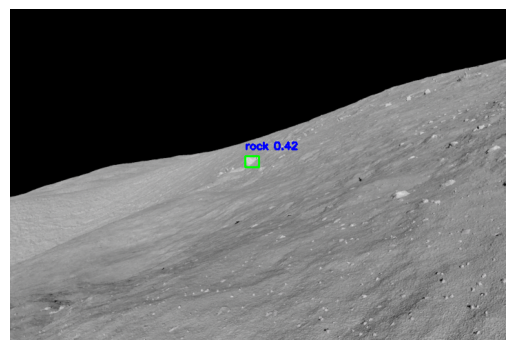


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0029.png: 352x512 4 rocks, 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


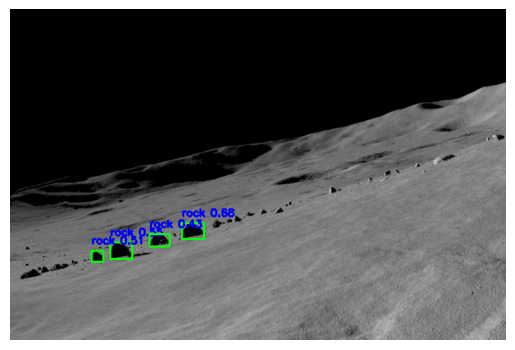


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0035.png: 352x512 (no detections), 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


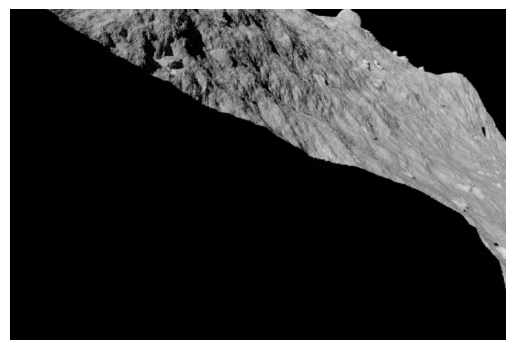


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0028.png: 352x512 2 rocks, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


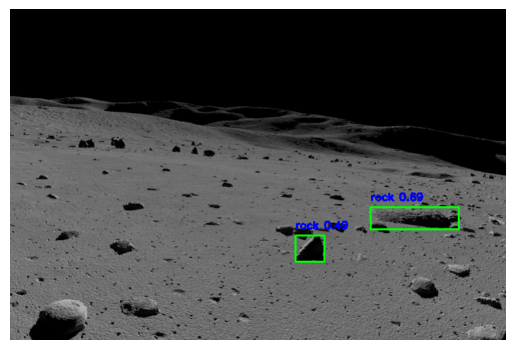


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0036.png: 352x512 7 rocks, 14.5ms
Speed: 0.8ms preprocess, 14.5ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


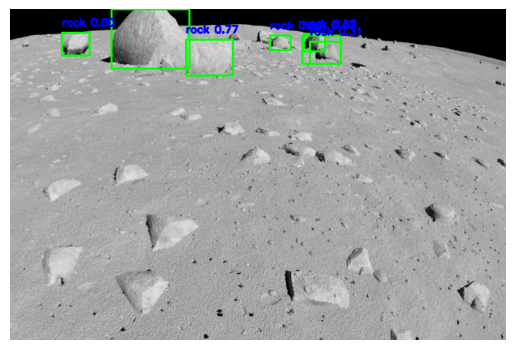


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0015.png: 352x512 5 rocks, 13.1ms
Speed: 0.8ms preprocess, 13.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


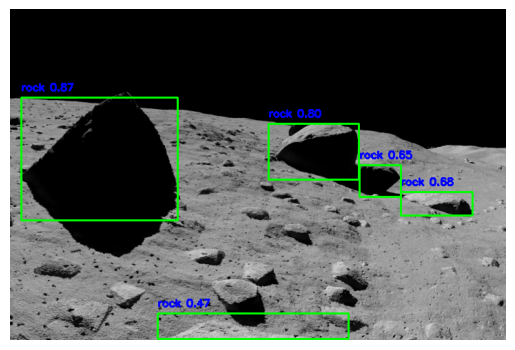


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0006.png: 352x512 (no detections), 14.7ms
Speed: 0.8ms preprocess, 14.7ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


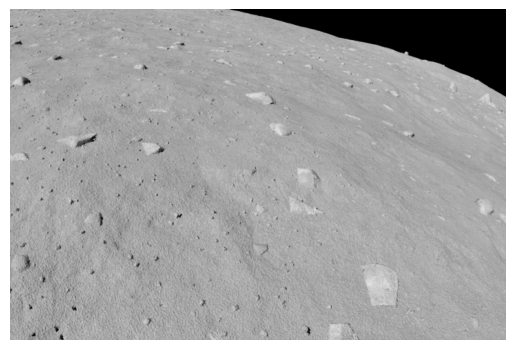


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0042.png: 352x512 8 rocks, 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 512)


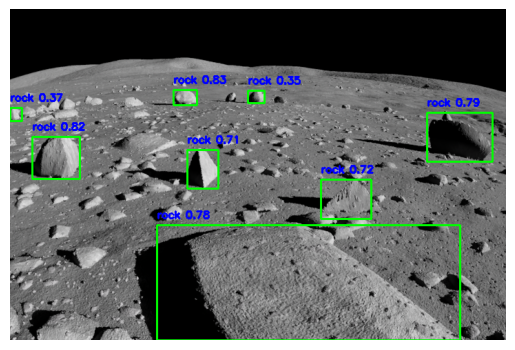


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0032.png: 352x512 (no detections), 14.7ms
Speed: 0.8ms preprocess, 14.7ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


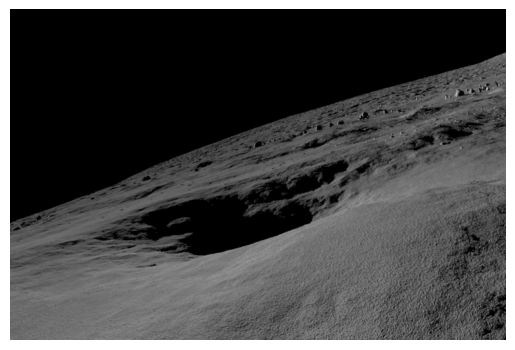


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0011.png: 352x512 6 rocks, 13.6ms
Speed: 0.8ms preprocess, 13.6ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 512)


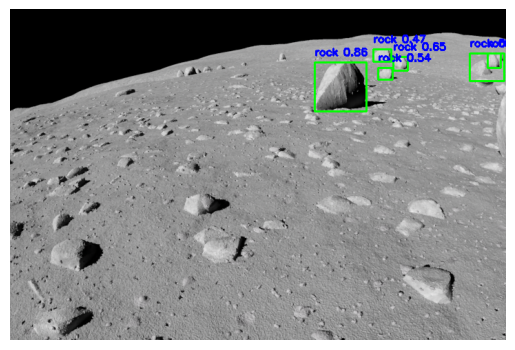


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0040.png: 352x512 1 rock, 14.9ms
Speed: 0.8ms preprocess, 14.9ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


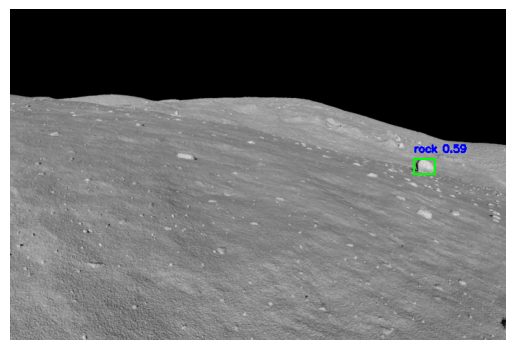


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0018.png: 352x512 (no detections), 15.1ms
Speed: 1.2ms preprocess, 15.1ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 512)


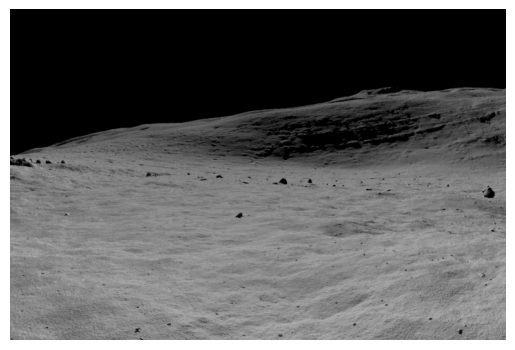


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0024.png: 352x512 (no detections), 14.2ms
Speed: 0.9ms preprocess, 14.2ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 512)


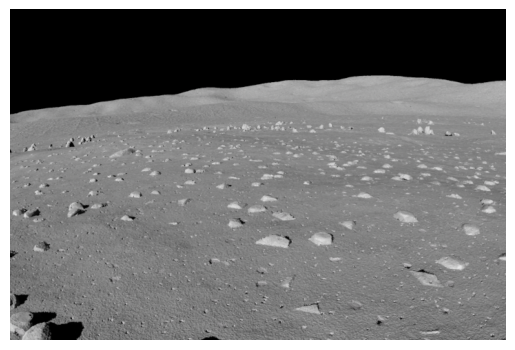


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0022.png: 352x512 (no detections), 15.0ms
Speed: 0.8ms preprocess, 15.0ms inference, 0.3ms postprocess per image at shape (1, 3, 352, 512)


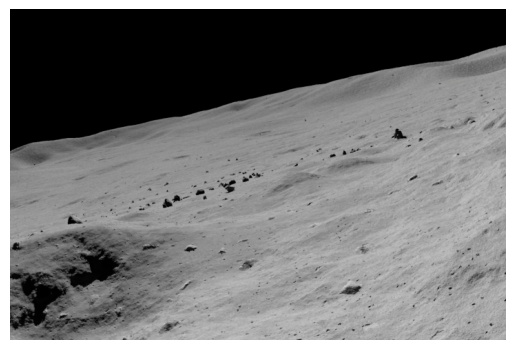


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0026.png: 352x512 5 rocks, 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


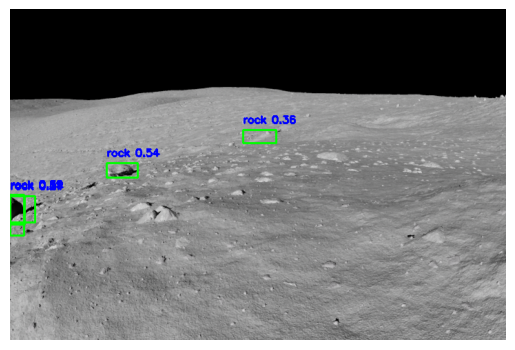


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0023.png: 352x512 2 rocks, 13.1ms
Speed: 1.0ms preprocess, 13.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


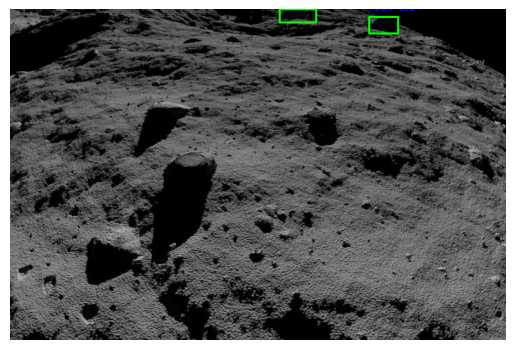


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0009.png: 352x512 (no detections), 13.6ms
Speed: 0.8ms preprocess, 13.6ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


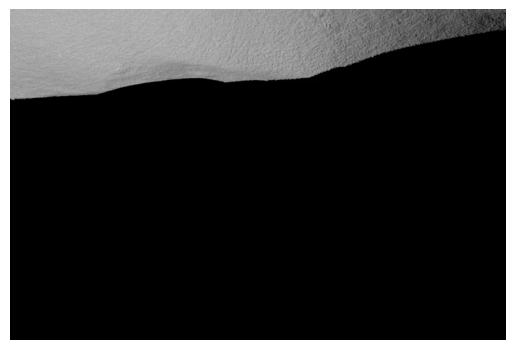


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0031.png: 352x512 3 rocks, 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


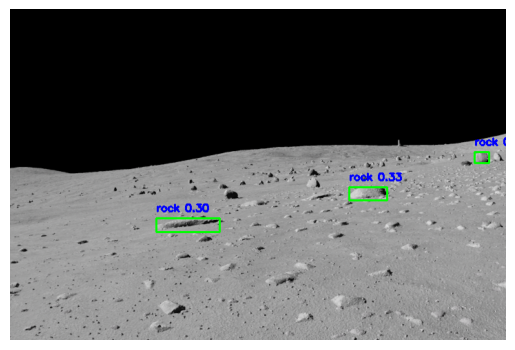


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0008.png: 352x512 (no detections), 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


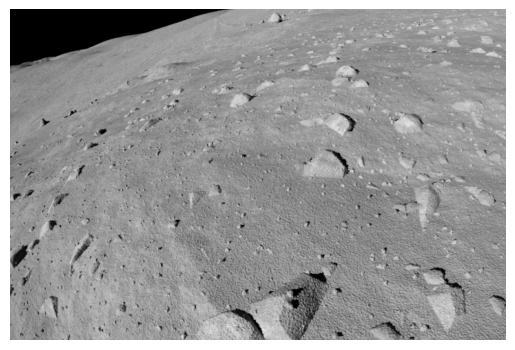


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0020.png: 352x512 (no detections), 14.4ms
Speed: 0.8ms preprocess, 14.4ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


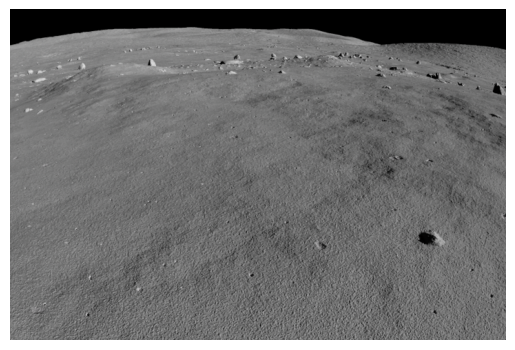


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0013.png: 352x512 6 rocks, 14.2ms
Speed: 0.8ms preprocess, 14.2ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 512)


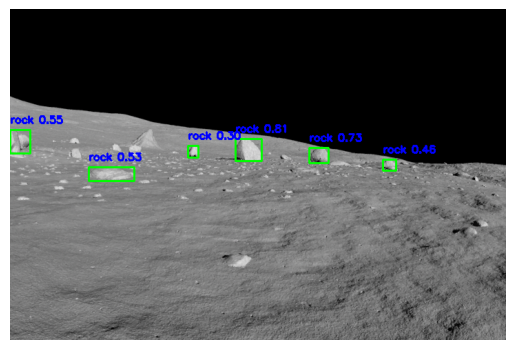


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0007.png: 352x512 1 rock, 13.1ms
Speed: 0.8ms preprocess, 13.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


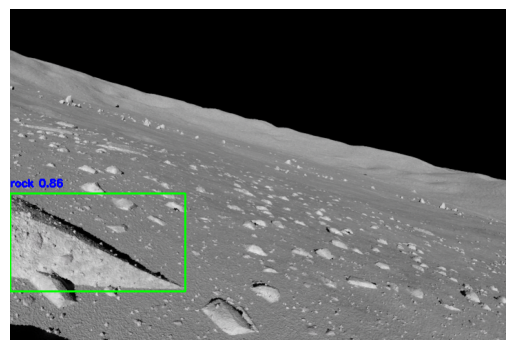


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0017.png: 352x512 (no detections), 13.1ms
Speed: 0.8ms preprocess, 13.1ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


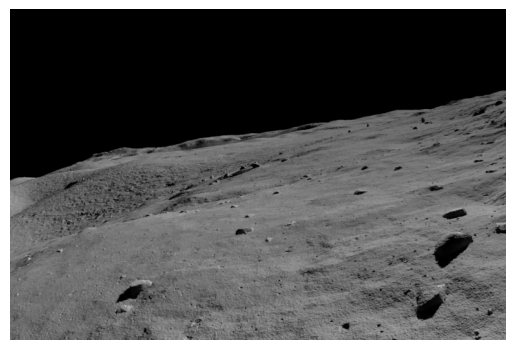


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0034.png: 352x512 3 rocks, 13.1ms
Speed: 0.6ms preprocess, 13.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


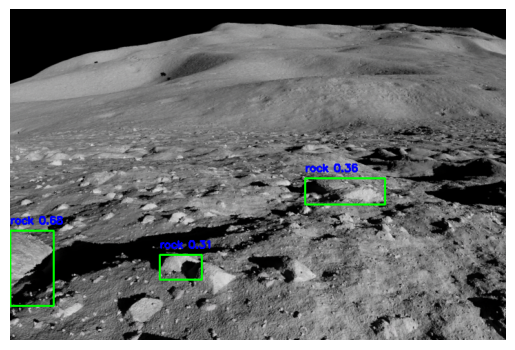


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0021.png: 352x512 (no detections), 14.0ms
Speed: 0.8ms preprocess, 14.0ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 512)


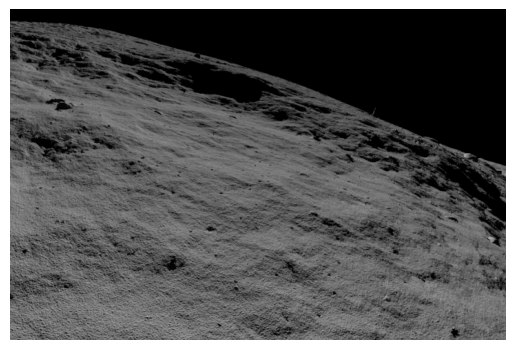


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0038.png: 352x512 3 rocks, 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


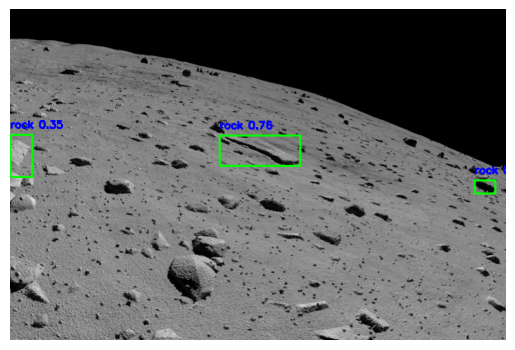


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0025.png: 352x512 (no detections), 14.4ms
Speed: 0.8ms preprocess, 14.4ms inference, 0.2ms postprocess per image at shape (1, 3, 352, 512)


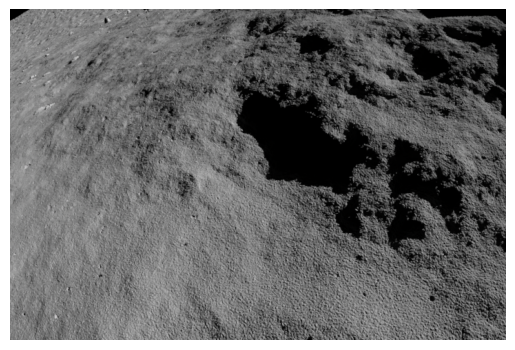


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0027.png: 352x512 10 rocks, 14.8ms
Speed: 0.8ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


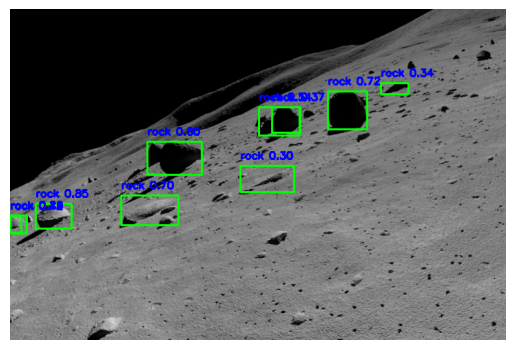


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch2/render0033.png: 352x512 2 rocks, 14.9ms
Speed: 0.8ms preprocess, 14.9ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


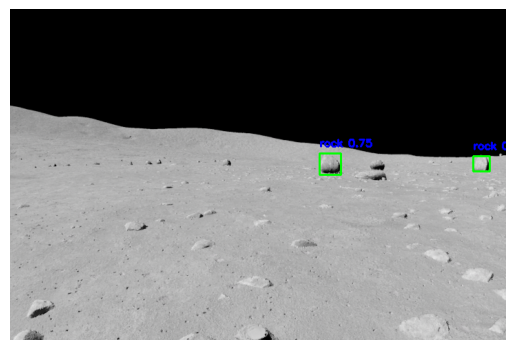

In [22]:
### Test From TestBatch2
### FAKE IMAGES

import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from itertools import chain
from ultralytics import YOLO

model = YOLO("./runs/detect/train15/weights/best.pt")  # Replace `expX` with the correct folder name

# Directory containing images
directory = Path(path_map['ROOT'] / "realimagetests/TestBatch2")

# Combine all images with .jpeg, .jpg, and .png extensions
image_files = chain(directory.glob("*.jpeg"), directory.glob("*.jpg"), directory.glob("*.png"))

# Loop through all images in the combined list
for fileLocation in image_files:
    # Convert Path object to string for OpenCV
    fileLocation = str(fileLocation)
    
    # Run prediction on the current image
    results = model.predict(source=fileLocation, save=False)

    # Load the image using OpenCV
    image = cv2.imread(fileLocation)

    # Get the class names from the model
    class_names = model.names

    # Loop through each result and draw bounding boxes
    for result in results:
        for box in result.boxes:
            # Get coordinates, confidence score, and class label
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Coordinates of the bounding box
            class_id = int(box.cls[0])  # Class ID as integer
            label = class_names[class_id]  # Get class label from model names
            confidence = box.conf[0]  # Get confidence score

            # Draw the bounding box
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # Display label and confidence
            cv2.putText(image, f"{label} {confidence:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Convert the image from BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with matplotlib
    plt.imshow(image_rgb)
    plt.axis("off")  # Turn off axis
    plt.show()


## Show Result of Trained Model on some IRL Images


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/GN3zMm6WcAAztBu.jpeg: 512x384 4 rocks, 15.1ms
Speed: 1.0ms preprocess, 15.1ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 384)


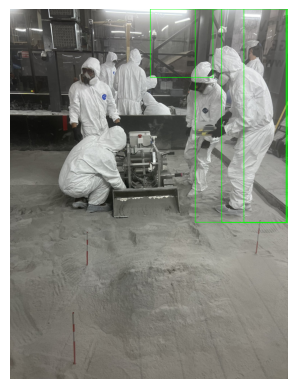


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/GN3zMnOXkAA3Kct.jpeg: 384x512 4 rocks, 14.7ms
Speed: 1.3ms preprocess, 14.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 512)


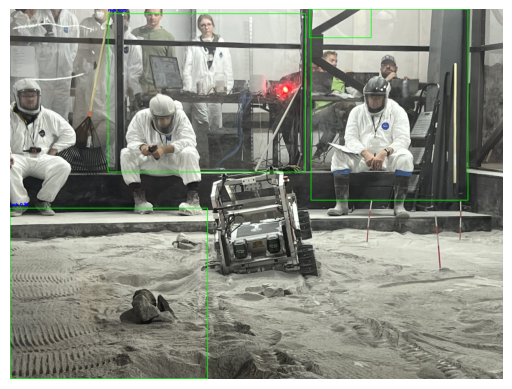


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/GN3zMm8W8AE9_gZ.jpeg: 384x512 1 rock, 16.3ms
Speed: 1.0ms preprocess, 16.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 512)


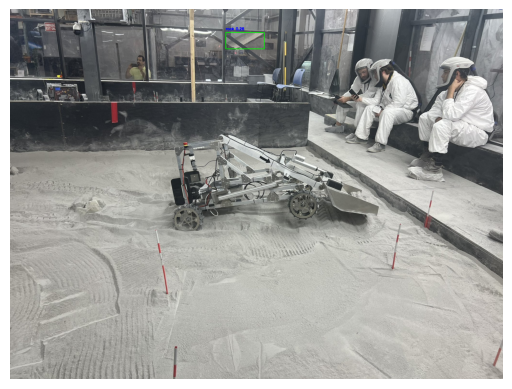


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/images.jpeg: 320x512 3 rocks, 15.1ms
Speed: 0.7ms preprocess, 15.1ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 512)


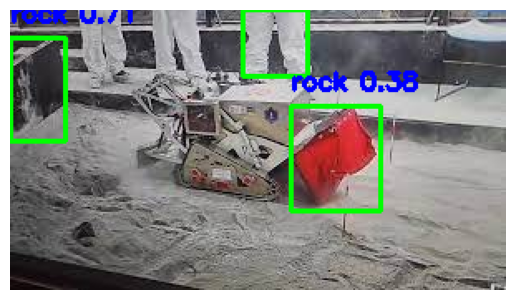


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/hq720.jpg: 288x512 5 rocks, 14.1ms
Speed: 0.7ms preprocess, 14.1ms inference, 0.5ms postprocess per image at shape (1, 3, 288, 512)


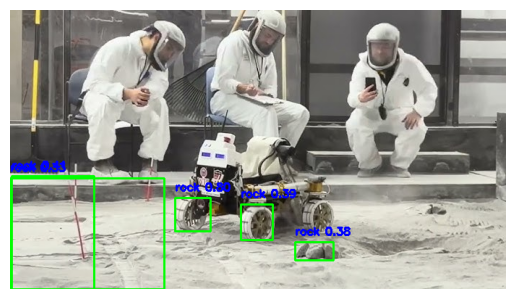


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/349587917_1156911965702583_3613484247482749819_n.jpg: 384x512 7 rocks, 15.9ms
Speed: 1.0ms preprocess, 15.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 512)


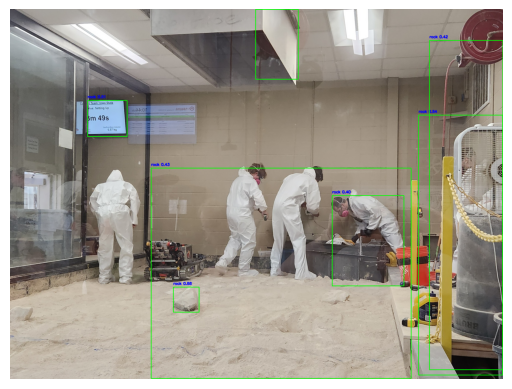


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/52130731577_59d8702f7a_b.jpg: 352x512 5 rocks, 14.1ms
Speed: 0.8ms preprocess, 14.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


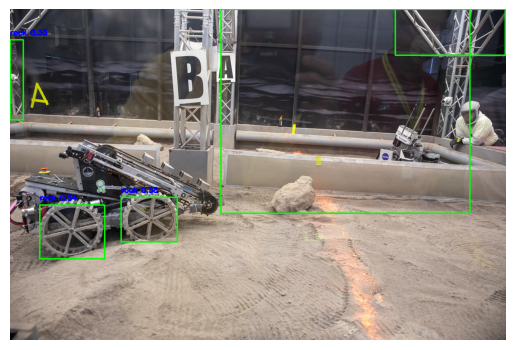


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/maxresdefault-2.jpg: 288x512 6 rocks, 12.7ms
Speed: 0.7ms preprocess, 12.7ms inference, 0.5ms postprocess per image at shape (1, 3, 288, 512)


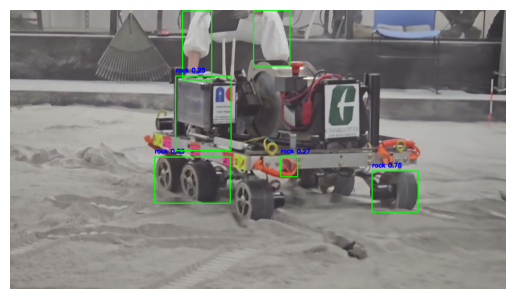


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/riegl1.jpg: 384x512 8 rocks, 14.3ms
Speed: 0.9ms preprocess, 14.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 512)


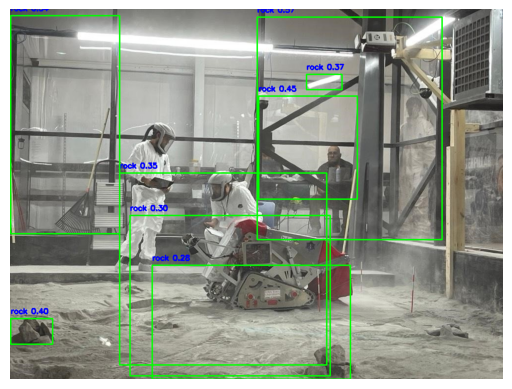


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/279414227_10159864727969183_3687371137980868393_n.jpg: 384x512 6 rocks, 14.0ms
Speed: 0.9ms preprocess, 14.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 512)


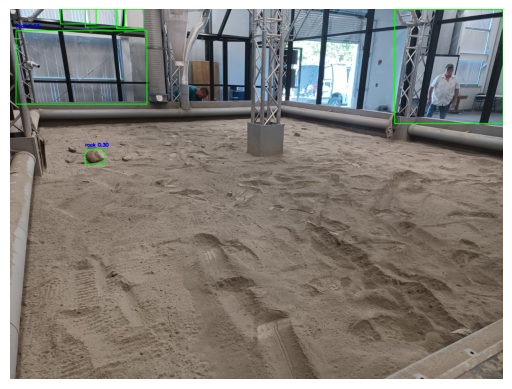


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/52100241677_2ba756a7fd_b.jpg: 352x512 12 rocks, 15.4ms
Speed: 0.9ms preprocess, 15.4ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 512)


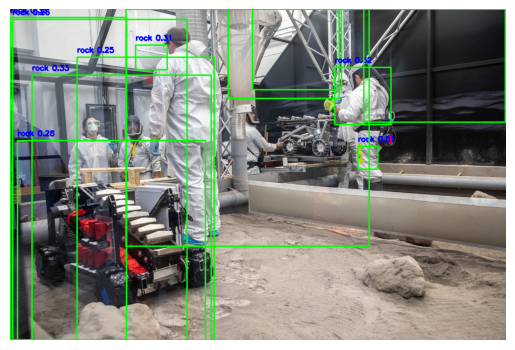


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/283362629_10159905360374183_3337151103503995844_n.jpg: 384x512 5 rocks, 14.3ms
Speed: 0.9ms preprocess, 14.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 512)


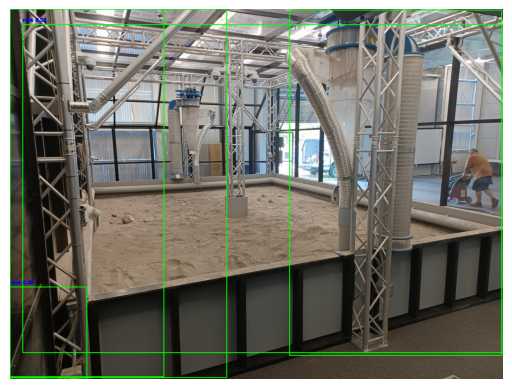


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/279196556_10159864727964183_6965913970933019643_n.jpg: 384x512 8 rocks, 14.9ms
Speed: 1.0ms preprocess, 14.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 512)


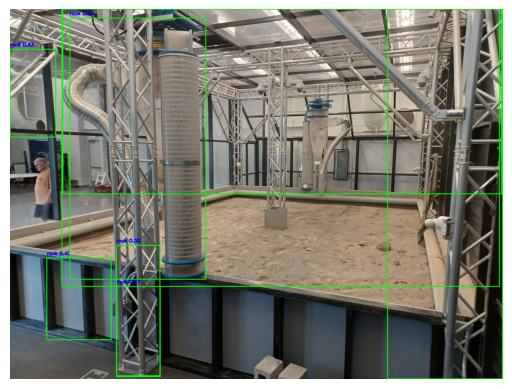


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/fea-nasa-lunabotics-2024-IMG_8998-2-1920x1152.jpg: 320x512 10 rocks, 14.3ms
Speed: 0.9ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 512)


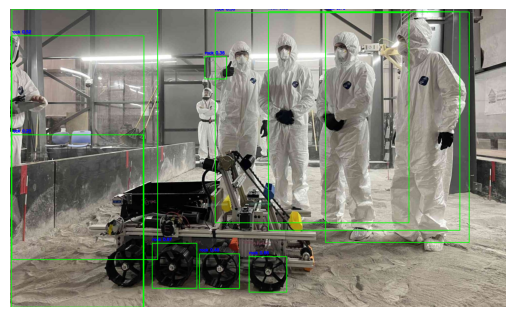


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/349178141_6052006498261410_5768358718441825179_n.jpg: 288x512 4 rocks, 12.2ms
Speed: 0.9ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 288, 512)


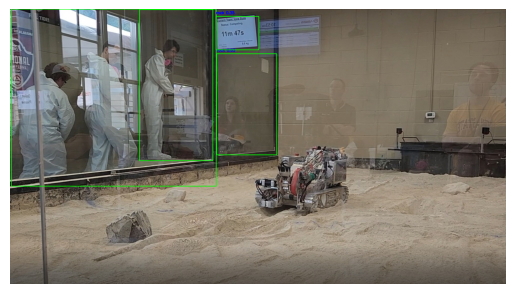


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/441540917_862107135949946_276876335388014190_n.jpg: 384x512 9 rocks, 15.0ms
Speed: 1.1ms preprocess, 15.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 512)


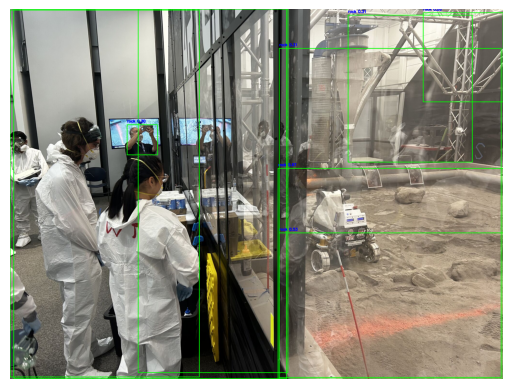


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/279173215_10159864727944183_3848041128585576297_n.jpg: 384x512 7 rocks, 15.0ms
Speed: 1.0ms preprocess, 15.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 512)


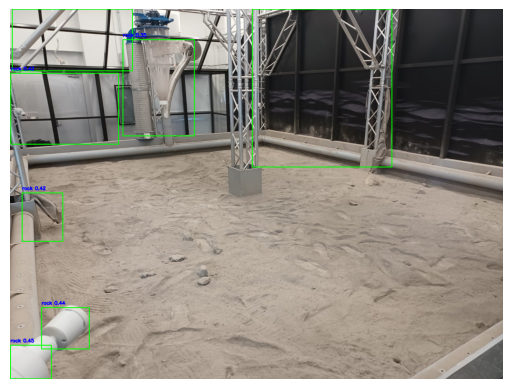


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/fea-nasa-lunabotics.jpg: 320x512 3 rocks, 13.5ms
Speed: 0.8ms preprocess, 13.5ms inference, 0.5ms postprocess per image at shape (1, 3, 320, 512)


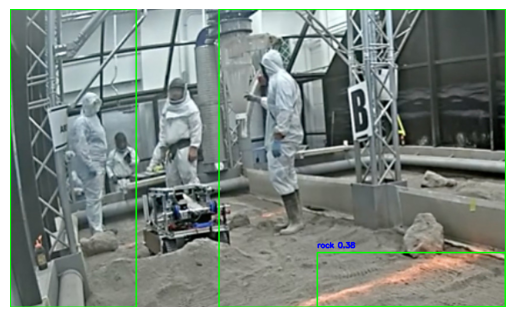


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/349693363_1697577333994453_4837614382100319016_n.jpg: 320x512 5 rocks, 13.3ms
Speed: 0.9ms preprocess, 13.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 512)


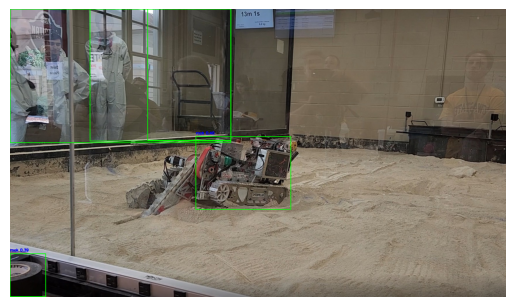


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/445204218_862107069283286_7366488337361330536_n.jpg: 384x512 7 rocks, 14.8ms
Speed: 1.0ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 512)


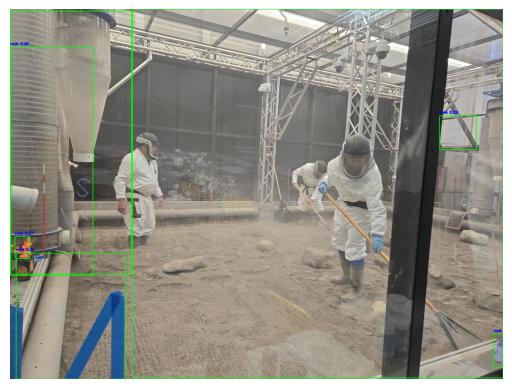


image 1/1 /home/microuasml/tmp/craterdetectionluna/realimagetests/TestBatch1/ksc-20230505-ph-alfp01-0001.png: 512x416 5 rocks, 16.3ms
Speed: 1.0ms preprocess, 16.3ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 416)


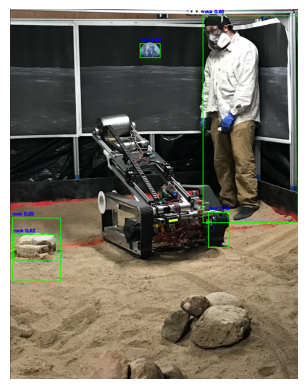

In [76]:
### Test From TestBatch1
### REAL IMAGES

import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from itertools import chain
from ultralytics import YOLO

model = YOLO("./runs/detect/train15/weights/best.pt")  # Replace `expX` with the correct folder name

# Directory containing images
directory = Path(path_map['ROOT'] / "realimagetests/TestBatch1")

# Combine all images with .jpeg, .jpg, and .png extensions
image_files = chain(directory.glob("*.jpeg"), directory.glob("*.jpg"), directory.glob("*.png"))

# Loop through all images in the combined list
for fileLocation in image_files:
    # Convert Path object to string for OpenCV
    fileLocation = str(fileLocation)
    
    # Run prediction on the current image
    results = model.predict(source=fileLocation, save=False)

    # Load the image using OpenCV
    image = cv2.imread(fileLocation)

    # Get the class names from the model
    class_names = model.names

    # Loop through each result and draw bounding boxes
    for result in results:
        for box in result.boxes:
            # Get coordinates, confidence score, and class label
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Coordinates of the bounding box
            class_id = int(box.cls[0])  # Class ID as integer
            label = class_names[class_id]  # Get class label from model names
            confidence = box.conf[0]  # Get confidence score

            # Draw the bounding box
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # Display label and confidence
            cv2.putText(image, f"{label} {confidence:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Convert the image from BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with matplotlib
    plt.imshow(image_rgb)
    plt.axis("off")  # Turn off axis
    plt.show()
